In [1]:
import pandas as pd
import folium

In [2]:
well_locations = pd.read_csv("data/MannvilleWells_LatLong.csv")

In [3]:
well_locations.head()

,SitID,UWI (AGS),UWI,HorID,Pick,Quality,lat,lng
0,102496,0674010812000,00/12-08-067-01W4/0,13000,475,3,54.785907,-110.129320
1,102497,0674020807000,00/07-08-067-02W4/0,13000,515,3,54.782284,-110.269446
2,102498,0674021109000,00/09-11-067-02W4/0,13000,480,3,54.785892,-110.186851
3,102500,0674022910000,00/10-29-067-02W4/0,13000,549,3,54.829624,-110.269422
4,102501,0674023406000,00/06-34-067-02W4/0,13000,529,2,54.840471,-110.224832


In [5]:
well_center_coord = [55.736558, -112.615421]

map_wells = folium.Map(location=well_center_coord, zoom_start=7,tiles='cartodbpositron', width = 640, height=480)

for index, row in well_locations.iterrows():
  folium.CircleMarker(location=[row['lat'], row['lng']], radius=1).add_to(map_wells)

map_wells.save('plot_data.html')

In [16]:
map_wells = folium.Map(location=well_center_coord, zoom_start=7,tiles='https://c.tile.opentopomap.org/{z}/{x}/{y}.png', width = 640, height=480, attr="<a href=https://opentopomap.org/>OpenTopoMap</a>")

for index, row in well_locations.iterrows():
    popup = folium.Popup(row['Pick'], parse_html=True)
    folium.CircleMarker(location=[row['lat'], row['lng']], radius=1, popup=popup).add_to(map_wells)

map_wells.add_child(folium.LatLngPopup())

map_wells

#map_wells.save('plot_data_2.html')

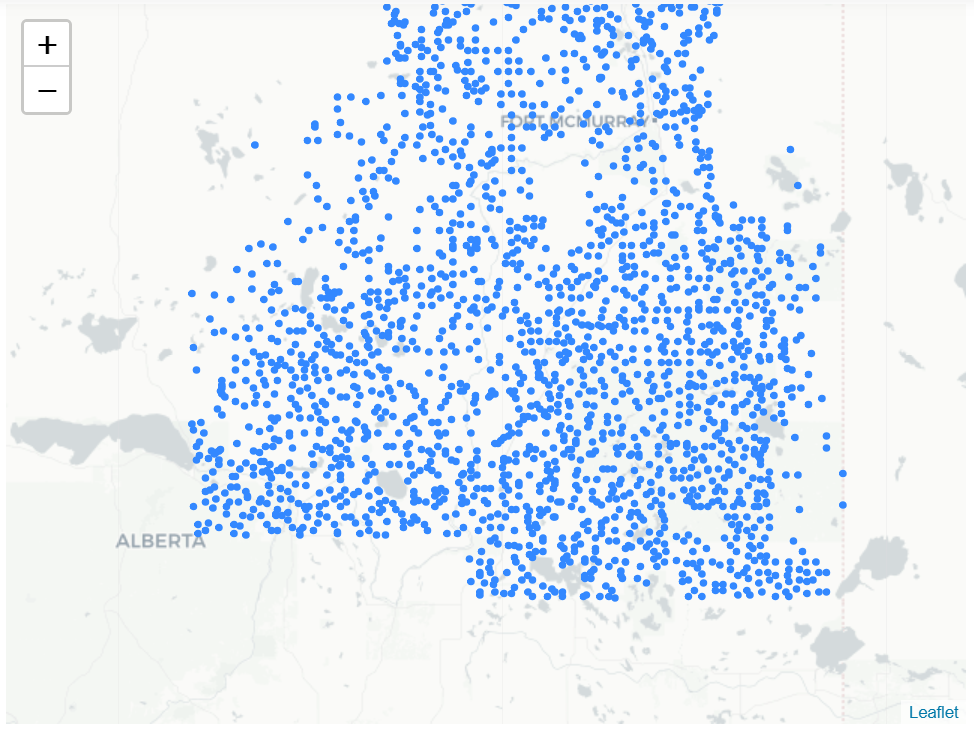

In [6]:
from IPython.display import Image
Image(filename='data/well_map.png', width=650) 

In [1]:
from bokeh.plotting import figure, show, output_file
from bokeh.tile_providers import CARTODBPOSITRON

output_file("tile.html")

# range bounds supplied in web mercator coordinates
p = figure(x_range=(-2000000, 6000000), y_range=(-1000000, 7000000),
           x_axis_type="mercator", y_axis_type="mercator")
p.add_tile(CARTODBPOSITRON)

show(p)

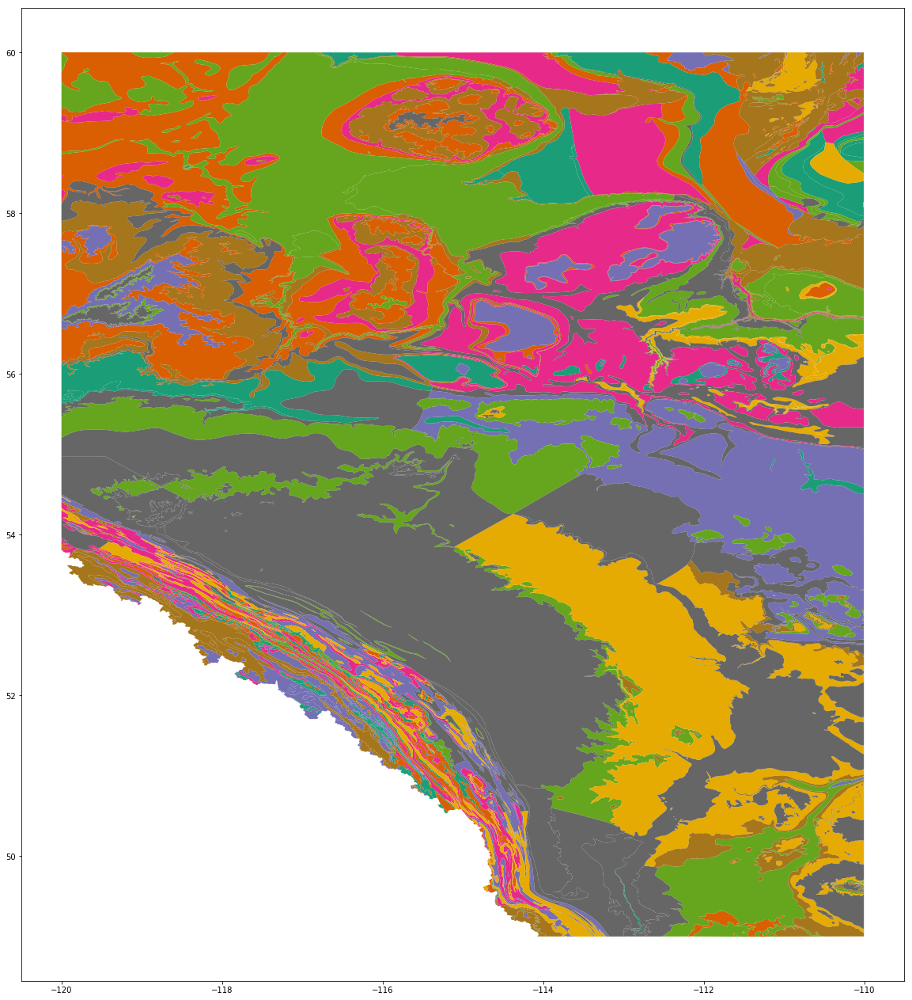

In [7]:
import geopandas as gpd

%matplotlib inline

bedrock_shp = gpd.read_file("data/MAP_600/DIG_2013_0018/bdrk_py_ll.shp")
bedrock_shp.plot(cmap='Dark2', figsize=(20,40))

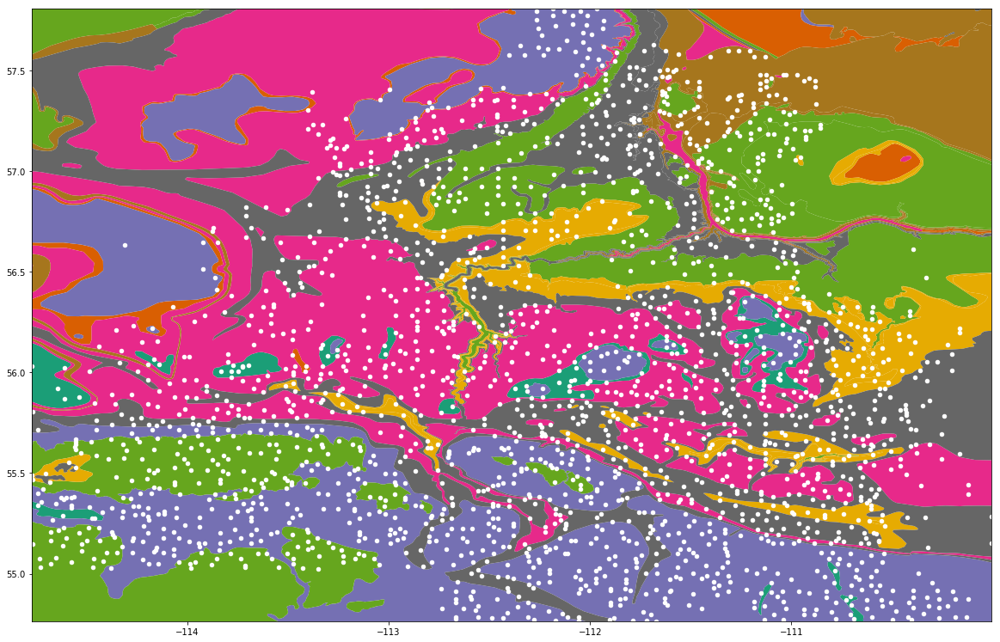

In [46]:
from shapely.geometry import Point, Polygon



geom = [Point(xy) for xy in zip(well_locations['lng'],well_locations['lat'])]
geo_df = gpd.GeoDataFrame(well_locations, geometry =geom)
geo_df.head()



ax = bedrock_shp.plot(cmap='Dark2', figsize=(20,40))

minx, miny, maxx, maxy = geo_df.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

geo_df.plot(markersize=20, ax=ax, color="white")

In [49]:
print(bedrock_shp.crs)

{'init': 'epsg:4269'}


C:\Users\gushi\Anaconda3\lib\site-packages\PIL\Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +


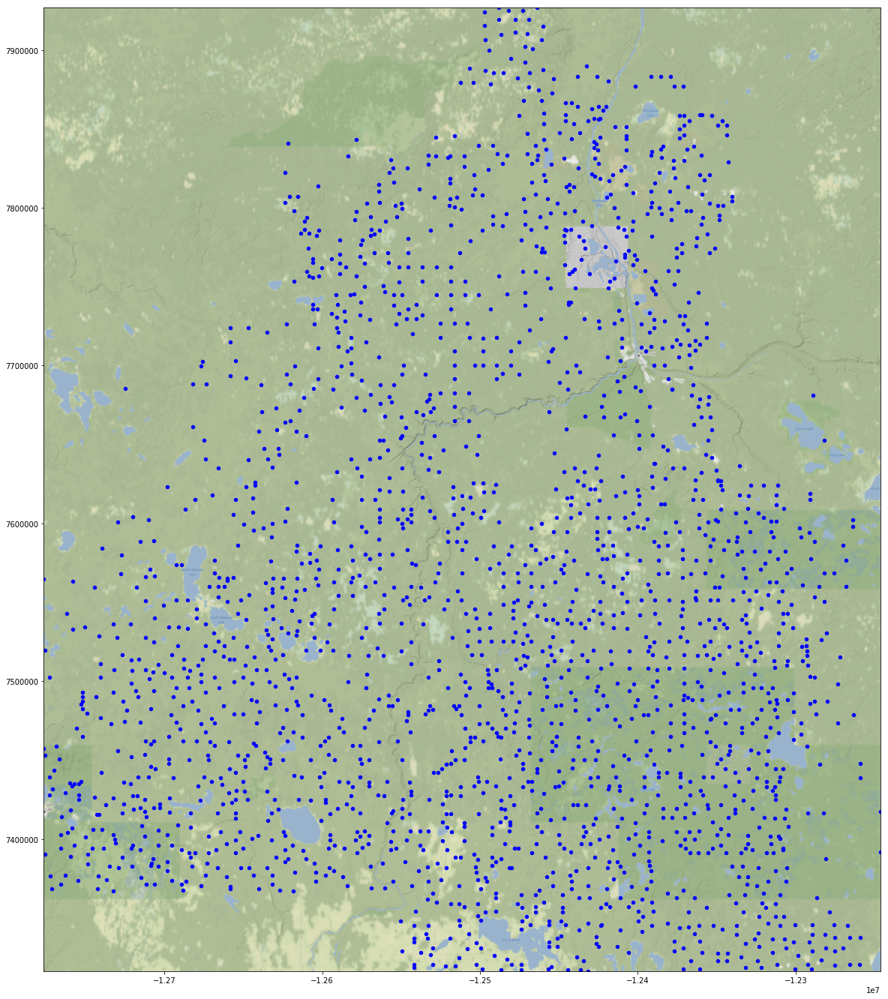

In [51]:
from shapely.geometry import Point, Polygon
import fiona

well_locations = pd.read_csv("data/MannvilleWells_LatLong.csv")

geom = [Point(xy) for xy in zip(well_locations['lng'],well_locations['lat'])]
geo_df = gpd.GeoDataFrame(well_locations, geometry =geom)
geo_df.head()

#geo_df = geo_df.to_crs(epsg=3857)

geo_df.crs = fiona.crs.from_epsg(4269)

geo_df = geo_df.to_crs(epsg=3857)
ax = geo_df.plot(markersize=20, color="blue",figsize=(20,40))

#ax = bedrock_shp.plot(cmap='Dark2', figsize=(20,40))

minx, miny, maxx, maxy = geo_df.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

import contextily as ctx

def add_basemap(ax, zoom, url='http://tile.stamen.com/terrain/tileZ/tileX/tileY.png'):
    xmin, xmax, ymin, ymax = ax.axis()
    basemap, extent = ctx.bounds2img(xmin, ymin, xmax, ymax, zoom=zoom, url=url)
    ax.imshow(basemap, extent=extent, interpolation='bilinear')
    # restore original x/y limits
    ax.axis((xmin, xmax, ymin, ymax))



add_basemap(ax, zoom=10)

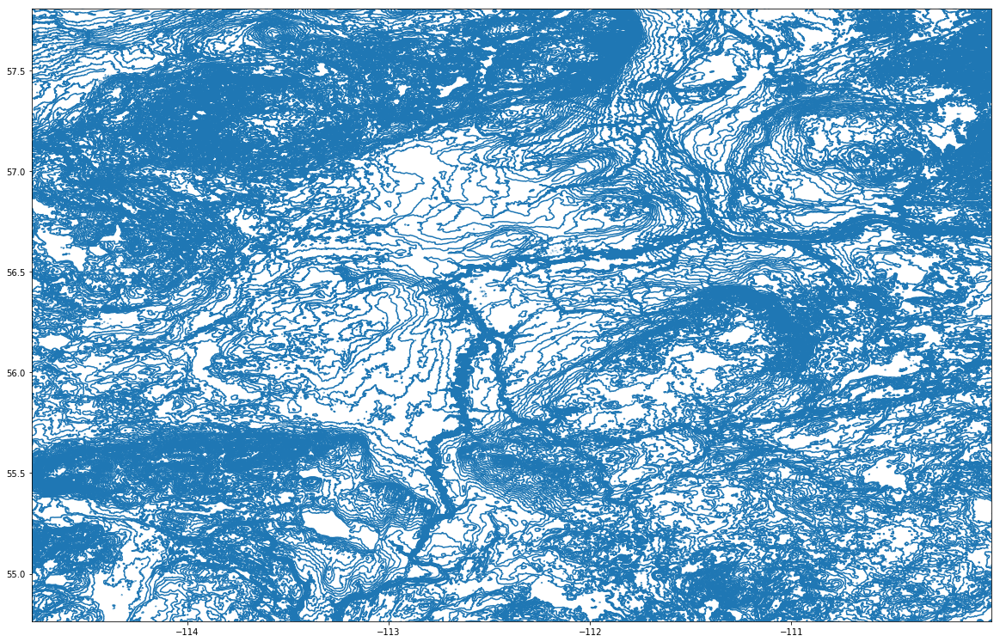

In [21]:
import geopandas as gpd

%matplotlib inline

bedrock_shp = gpd.read_file("data/canvec_50K_AB_Elevation/contour_1.shp")
#bedrock_shp.plot(cmap='Dark2', figsize=(20,40))

geom = [Point(xy) for xy in zip(well_locations['lng'],well_locations['lat'])]
geo_df = gpd.GeoDataFrame(well_locations, geometry =geom)
geo_df.head()



ax = bedrock_shp.plot(figsize=(20,40))

minx, miny, maxx, maxy = geo_df.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

geo_df.plot(markersize=20, ax=ax, color="white")

In [9]:
geom = [Point(xy) for xy in zip(well_locations['lng'],well_locations['lat'])]
well_geodf = gpd.GeoDataFrame(well_locations, geometry =geom)

map_wells = folium.Map(location=well_center_coord, zoom_start=7,tiles='Stamen Terrain', width = 640, height=480)

for index, row in well_locations.iterrows():
  folium.CircleMarker(location=[row['lat'], row['lng']], radius=1).add_to(map_wells)

#well_geodf.head()

map_wells.add_child(folium.LatLngPopup())

map_wells

In [12]:
geom = [Point(xy) for xy in zip(well_locations['lng'],well_locations['lat'])]
well_geodf = gpd.GeoDataFrame(well_locations, geometry =geom)

map_wells = folium.Map(location=well_center_coord, zoom_start=7,tiles='https://s3.amazonaws.com/elevation-tiles-prod/normal/{z}/{x}/{y}.png', width = 640, height=480, attr="<a href=https://endless-sky.github.io/>Endless Sky</a>")

for index, row in well_locations.iterrows():
  folium.CircleMarker(location=[row['lat'], row['lng']], radius=1).add_to(map_wells)

#well_geodf.head()

map_wells.add_child(folium.LatLngPopup())

map_wells

In [18]:
geom = [Point(xy) for xy in zip(well_locations['lng'],well_locations['lat'])]
well_geodf = gpd.GeoDataFrame(well_locations, geometry =geom)

map_wells = folium.Map(location=well_center_coord, zoom_start=7,tiles='https://c.tile.opentopomap.org/{z}/{x}/{y}.png', width = 640, height=480, attr="<a href=https://endless-sky.github.io/>Endless Sky</a>")

for index, row in well_locations.iterrows():
  folium.CircleMarker(location=[row['lat'], row['lng']], radius=1).add_to(map_wells)

#well_geodf.head()

map_wells.add_child(folium.LatLngPopup())

map_wells